# Kim Hai's Mini Project 1: Exploration of Austin, Texas data from bikeshare and crime datasets

# Introduction:

This mini-project will look at 3 tables from 2 datasets: Austin bikeshare (which contains the stations and trips tables) and the Austin crime dataset (which contained the crime table) 

The working hypothesis of this mini-project is: The higher the occurence of crimes in a particular district will negatively impact the likelihood of stations being installed. Ie, if an area has a high number of crimes, I am expecting that the number of stations in that particular council districts will be low.

## Import necessary Modules and Libraries

In [1]:
# Import necessary modules
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
import requests
import json
from datetime import datetime, date, time
import folium
import random
from datetime import timedelta

from google.cloud import bigquery
from google.cloud import storage
from google.cloud import bigquery_storage


%matplotlib inline

In [2]:
# Connect to the API and get the data
# Get the key to the Google Cloud platform from the secrets document
key_path = r'resolute-mote-462623-v5-c4c05ed61421.json'          #: this json file contains the gcp BigQuery Secrets on user's local machine

## Google Cloud Setup Code Chunk

In [3]:
# Google Cloud setup 
storage_client = storage.Client.from_service_account_json(key_path)
client = bigquery.Client.from_service_account_json(key_path)
print(client.project) # check if this is the correct project
client = bigquery.Client.from_service_account_json(key_path, project = 'bigquery-public-data') # client to access the opensource data
#client = bigquery.Client.from_service_account_json(key_path, project = 'resolute-mote-462623-v5') # <- personal project code with 'owner' role
print(client.project)

resolute-mote-462623-v5
bigquery-public-data


In [4]:
# Check if austin_bikeshare and austin_crime dataset is in the list of datasets retrieved:
def printDatasetList(client):
    project = client.project    #: only one project can be associated with a client instance
    datasets = list(client.list_datasets())
    if datasets:
        print('Datasets in project {}:'.format(project))
        for dataset in datasets:
            print('\t{}'.format(dataset.dataset_id))
        found = True
    else:
        print('{} project does not contain any datasets.'.format(project))
        found = False
    return found

In [5]:
# list datasets in the default project:
#flag = printDatasetList(client)  #: assigning to `flag` suppresses printing the return value (normally `True`)

In [6]:
austin_bikeshare_id='austin_bikeshare'
austin_crime_id='austin_crime'

austin_bikeshare_ref= client.dataset(austin_bikeshare_id, project = 'bigquery-public-data')
austin_crime_ref= client.dataset(austin_crime_id, project = 'bigquery-public-data')

bigquery-public-data.austin_bikeshare? 

trips and stations + 

austincrime? 


https://console.cloud.google.com/bigquery?inv=1&invt=Abzz5w&project=resolute-mote-462623-v5

In [7]:
# Do some EDA

## printTableList Helper function (Lifted from Lab 3.2.3)

In [8]:
# Check if the dataset has multiple tables 
# function for listing tables in a dataset:
def printTableList(client, dataset_id):
    project = client.project
    dataset_ref = client.dataset(dataset_id, project = project)
    tables = list(client.list_tables(dataset_ref))
    if tables:
        print('Tables in dataset {}:'.format(dataset_id))
        for table in tables:
            print('\t{}'.format(table.table_id))
        found = True
    else:
        print('{} dataset does not contain any tables.'.format(dataset_id))
        found = False
    return found

In [9]:
#Bikeshare
printTableList(client, austin_bikeshare_id) # returns 2 tables: bikeshare stations and bikeshare trips

Tables in dataset austin_bikeshare:
	bikeshare_stations
	bikeshare_trips


True

In [10]:
# Crime
printTableList(client, austin_crime_id) # returns 1 table: crime

Tables in dataset austin_crime:
	crime


True

In [11]:
#Extract the respective tables with the API call:

In [12]:
# Bikeshare dataset (2 tables)
stations_table_id = 'bikeshare_stations'
trips_table_id = 'bikeshare_trips'
stations_table_ref = austin_bikeshare_ref.table(stations_table_id)
trips_table_ref = austin_bikeshare_ref.table(trips_table_id)
stations_table = client.get_table(stations_table_ref)  # API Request
trips_table = client.get_table(trips_table_ref)  # API Request

In [13]:
# Crime dataset:
crime_table_id = 'crime'
crime_table_ref = austin_crime_ref.table(crime_table_id)
crime_table = client.get_table(crime_table_ref)  # API Request

## printTableSchema Help function (Lifted from Lab 3.2.3)

In [14]:
def printTableSchema(aTable):
    schemas = list(aTable.schema)
    if schemas:
        print('Table schema for {}:'.format(aTable.table_id))
        for aSchema in schemas:
            print('\t{0} {1}'.format(aSchema.name, aSchema.field_type))
        found = True
    else:
        found = False
    return found

## Print the table schema so we will know how to index the columns of interest in the table 

In [15]:
#Stations table schema:
printTableSchema(client.get_table(stations_table_ref))

Table schema for bikeshare_stations:
	station_id INTEGER
	name STRING
	status STRING
	location STRING
	address STRING
	alternate_name STRING
	city_asset_number INTEGER
	property_type STRING
	number_of_docks INTEGER
	power_type STRING
	footprint_length INTEGER
	footprint_width FLOAT
	notes STRING
	council_district INTEGER
	image STRING
	modified_date TIMESTAMP


True

In [16]:
#Trips table schema:
printTableSchema(client.get_table(trips_table_ref))

Table schema for bikeshare_trips:
	trip_id STRING
	subscriber_type STRING
	bike_id STRING
	bike_type STRING
	start_time TIMESTAMP
	start_station_id INTEGER
	start_station_name STRING
	end_station_id STRING
	end_station_name STRING
	duration_minutes INTEGER


True

In [17]:
# Crime table schema:
printTableSchema(client.get_table(crime_table_ref))

Table schema for crime:
	unique_key INTEGER
	address STRING
	census_tract FLOAT
	clearance_date TIMESTAMP
	clearance_status STRING
	council_district_code INTEGER
	description STRING
	district STRING
	latitude FLOAT
	longitude FLOAT
	location STRING
	location_description STRING
	primary_type STRING
	timestamp TIMESTAMP
	x_coordinate INTEGER
	y_coordinate INTEGER
	year INTEGER
	zipcode STRING


True

## SQL queries on public data with personal project credentials

In [18]:
# Get all of stations table:
stations_all_sql = "SELECT * FROM bigquery-public-data.austin_bikeshare.bikeshare_stations"
client = bigquery.Client.from_service_account_json(key_path, project = 'resolute-mote-462623-v5') # <- personal project code with 'owner' role
query_job = client.query(stations_all_sql)
stations_all_df = query_job.to_dataframe()

if len(stations_all_df) ==0:
    # Load from csv instead
    stations_all_df=pd.read_csv(r"C:\Users\koh_k\Downloads\Institute of Data\Labs\Module 3\Labs 3\google-bigQuery-austin-bikeshare-stations-table-all.csv")
#stations_head_df

In [19]:
# Get all of trips table:
trips_all_sql = "SELECT * FROM bigquery-public-data.austin_bikeshare.bikeshare_trips"
client = bigquery.Client.from_service_account_json(key_path, project = 'resolute-mote-462623-v5') # <- personal project code with 'owner' role
query_job = client.query(trips_all_sql)
trips_all_df = query_job.to_dataframe()


In [20]:
# Get all of crimes table:
crimes_all_sql = "SELECT * FROM bigquery-public-data.austin_crime.crime"
client = bigquery.Client.from_service_account_json(key_path, project = 'resolute-mote-462623-v5') # <- personal project code with 'owner' role
query_job = client.query(crimes_all_sql)
crimes_all_df = query_job.to_dataframe()


In [21]:
# If the dataframes have not been saved as csv, create a new csv and write the dataframe to it, else, it should not create the csv file again 
try:
    stations_all_df.to_csv('google-bigQuery-austin-bikeshare-stations-table-all.csv',mode='x')
except FileExistsError:
    print('stations table already saved in .csv file in this location!')
except Exception as e:
    print(f'caught {type(e)}: e')

stations table already saved in .csv file in this location!


In [22]:
# If the dataframes have not been saved as csv, create a new csv and write the dataframe to it, else, it should not create the csv file again 
try:
    trips_all_df.to_csv('google-bigQuery-austin-bikeshare-trips-table-all.csv',mode='x')
except FileExistsError:
    print('trips table already saved in .csv file in this location!')
except Exception as e:
    print(f'caught {type(e)}: e')

trips table already saved in .csv file in this location!


In [23]:
# If the dataframes have not been saved as csv, create a new csv and write the dataframe to it, else, it should not create the csv file again 
try:
    crimes_all_df.to_csv('google-bigQuery-austin-crime-crime-table-all.csv',mode='x')
except FileExistsError:
    print('crime table already saved in .csv file in this location!')
except Exception as e:
    print(f'caught {type(e)}: e')

crime table already saved in .csv file in this location!


## EDA of table(s)

### austin_bikeshare.stations EDA

In [24]:
# Inspect the data
stations_all_df.head()

,station_id,name,status,location,address,alternate_name,city_asset_number,property_type,number_of_docks,power_type,footprint_length,footprint_width,notes,council_district,image,modified_date
0,1001,OFFICE/Main/Shop/Repair,closed,"(30.27186, -97.73997)",1000 Brazos,None,<NA>,None,<NA>,None,<NA>,NaN,This is the testing dock/station located at BS...,1,None,2022-03-04 09:58:00+00:00
1,1002,6th & Navasota St.,closed,"(30.26383, -97.72864)",1308 W. 6th St.,None,<NA>,None,<NA>,None,<NA>,NaN,None,3,None,2021-01-04 00:00:00+00:00
2,1003,8th & Guadalupe,closed,"(30.27106, -97.74563)",800 Guadalupe St.,None,<NA>,None,<NA>,None,<NA>,NaN,None,9,None,2021-01-04 00:00:00+00:00
3,1004,Red River & LBJ Library,closed,"(30.2848, -97.72756)",2322 Red River Street,None,<NA>,None,<NA>,None,<NA>,NaN,None,1,None,2021-01-04 00:00:00+00:00
4,2576,Rainey @ River St,closed,"(30.25802, -97.7391)",64 Rainey St,None,<NA>,None,<NA>,None,<NA>,NaN,None,9,None,2021-01-04 00:00:00+00:00


#### Comment: We can see that there are a lot of null values in this table just within the first 5 rows, let's understand the table better with .info()

In [25]:
stations_all_df.info()

# 101 entries,0 to 100 rows
# Columns 5 alternate name      99 NULL values
#  "      6 city asset number   24 NULL values
#  "      7 property type       20 NULL values
#  "      8 number of docks     20 NULL values
#  "      9 power_type          20 NULL values
#  "      10 footprint length   22 NULL values
#  "      11 foorprint width    22 NULL values
#  "      13 notes              70 NULL values
#  "      14 image              101 NULL values -> drop

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101 entries, 0 to 100
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype              
---  ------             --------------  -----              
 0   station_id         101 non-null    Int64              
 1   name               101 non-null    object             
 2   status             101 non-null    object             
 3   location           101 non-null    object             
 4   address            100 non-null    object             
 5   alternate_name     2 non-null      object             
 6   city_asset_number  77 non-null     Int64              
 7   property_type      81 non-null     object             
 8   number_of_docks    81 non-null     Int64              
 9   power_type         81 non-null     object             
 10  footprint_length   79 non-null     Int64              
 11  footprint_width    79 non-null     float64            
 12  notes              31 non-null     object         

In [26]:
stations_all_df.describe()

,station_id,city_asset_number,number_of_docks,footprint_length,footprint_width,council_district
count,101.0,77.0,81.0,79.0,79.000000,101.0
mean,2914.316832,22933.402597,13.580247,38.810127,5.512658,6.574257
std,969.304833,7814.504916,2.827827,8.498983,1.527472,3.302564
min,0.0,16597.0,9.0,15.0,5.000000,1.0
25%,2539.0,16738.0,12.0,35.0,5.000000,3.0
50%,2575.0,16756.0,13.0,40.0,5.000000,9.0
75%,3790.0,32670.0,15.0,40.0,5.000000,9.0
max,4879.0,32746.0,22.0,55.0,15.000000,10.0


#### only footprint length and width are meaningful columns for this summary statistics 

In [27]:
# Drop image column 
stations_all_df.drop(['image'],axis=1,inplace=True)

### Stations table data interrogation

#### Value counts of columns in stations table

In [28]:
stations_all_df['alternate_name'].value_counts()  # not a very interesting column to investigate

alternate_name
Zilker Park at Barton Springs and William Burton Drive    1
Congress & 6th Street                                     1
Name: count, dtype: int64

In [29]:
stations_all_df['property_type'].value_counts()

property_type
sidewalk                28
undetermined_parking    20
paid_parking            19
nonmetered_parking       8
parkland                 6
Name: count, dtype: int64

In [30]:
stations_all_df['footprint_length'].value_counts()  # could be used for visualisation

footprint_length
40    38
35     8
30     8
45     7
55     7
20     3
50     3
25     3
26     1
15     1
Name: count, dtype: Int64

In [31]:
stations_all_df['footprint_width'].value_counts()

footprint_width
5.0     68
7.5      7
10.0     2
15.0     1
8.0      1
Name: count, dtype: int64

In [32]:
stations_all_df['council_district'].value_counts() # will need to cross reference with 3rd party information to understand this

council_district
9     59
1     16
3     16
5      5
8      3
10     2
Name: count, dtype: Int64

In [33]:
#stations_all_df

### austin_bikeshare.trips EDA

In [34]:
trips_all_df.head() # over 2million rows! limit prints and tests

,trip_id,subscriber_type,bike_id,bike_type,start_time,start_station_id,start_station_name,end_station_id,end_station_name,duration_minutes
0,27528286,Single Trip (Pay-as-you-ride),21422,electric,2022-08-20 14:03:38+00:00,4051,10th/Red River,4051,10th/Red River,102
1,28953173,Student Membership,21821,electric,2023-02-26 02:33:47+00:00,4051,10th/Red River,4051,10th/Red River,2
2,28833031,Explorer,18181,electric,2023-02-04 17:52:20+00:00,4051,10th/Red River,4051,10th/Red River,4
3,28181257,Local31,829,classic,2022-10-13 14:42:31+00:00,4051,10th/Red River,4051,10th/Red River,13
4,28344994,Explorer,996,classic,2022-10-29 16:01:27+00:00,4051,10th/Red River,4051,10th/Red River,129


In [35]:
trips_all_df.info() # over 2million rows! limit prints and tests

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2271152 entries, 0 to 2271151
Data columns (total 10 columns):
 #   Column              Dtype              
---  ------              -----              
 0   trip_id             object             
 1   subscriber_type     object             
 2   bike_id             object             
 3   bike_type           object             
 4   start_time          datetime64[us, UTC]
 5   start_station_id    Int64              
 6   start_station_name  object             
 7   end_station_id      object             
 8   end_station_name    object             
 9   duration_minutes    Int64              
dtypes: Int64(2), datetime64[us, UTC](1), object(7)
memory usage: 177.6+ MB


In [36]:
trips_all_df.describe() 

,start_station_id,duration_minutes
count,2266705.0,2271152.0
mean,3252.173349,28.719178
std,1033.208271,125.316666
min,1001.0,2.0
25%,2547.0,6.0
50%,2707.0,11.0
75%,3797.0,27.0
max,7637.0,34238.0


#### Value counts of columns in trips table

In [37]:
trips_all_df['duration_minutes'].values

<IntegerArray>
[102,   2,   4,  13, 129, 106,  20,  32,  40,   3,
 ...
  53,  30, 149, 221,   2,   2,  32,  34,  26,  27]
Length: 2271152, dtype: Int64

In [38]:
np.sort(trips_all_df['duration_minutes'].value_counts())

array([     1,      1,      1, ..., 151142, 167513, 171706], dtype=int64)

In [39]:
upToSixtyMins_idx= np.where(trips_all_df['duration_minutes']<=60.0)
overSixtyMins_idx= np.where(trips_all_df['duration_minutes']>60.0)

upToSixtyMins=trips_all_df[['duration_minutes']].iloc[upToSixtyMins_idx]
overSixtyMins=trips_all_df[['duration_minutes']].iloc[overSixtyMins_idx]


#### Percentage of upToSixtyMins

In [40]:
print(len(upToSixtyMins)/len(trips_all_df['duration_minutes']))

0.9250789907500687


#### Visual Distribution of upToSixtyMins

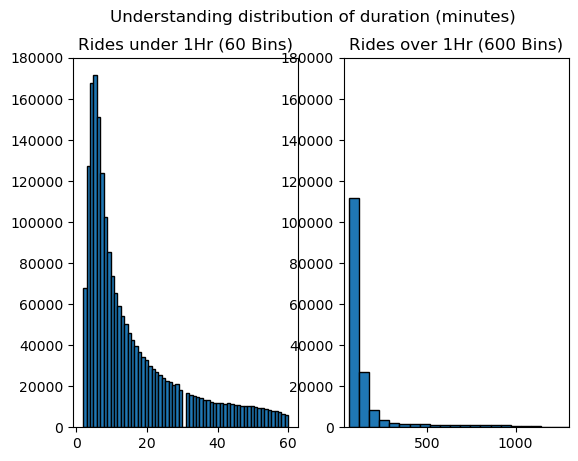

In [41]:
plt.figure()
plt.suptitle('Understanding distribution of duration (minutes)')
ax1=plt.subplot(121)
ax1.set_ylim([0 ,1.80e5])
#ax1.set_xlim([0,30])
plt.hist(upToSixtyMins,bins=60,edgecolor="black")
plt.title('Rides under 1Hr (60 Bins)')
ax2=plt.subplot(122)
ax2.set_ylim([0 ,1.80e5])
ax2.set_xlim([31,1300])
plt.hist(overSixtyMins,bins=600,edgecolor="black")
plt.title('Rides over 1Hr (600 Bins)')
plt.show()

In [42]:
trips_all_df['bike_type'].value_counts()

bike_type
classic     1347722
electric     923430
Name: count, dtype: int64

In [43]:
trips_all_df['start_station_name'].value_counts()

start_station_name
21st/Speedway @ PCL      108559
21st & Speedway @PCL      71145
Dean Keeton/Speedway      65066
Zilker Park               49294
26th/Nueces               44179
                          ...  
Eeyore's 2018                 2
Eeyore's 2017                 1
Mobile Station                1
Stolen                        1
cesar Chavez/Congress         1
Name: count, Length: 201, dtype: int64

In [44]:
trips_all_df['subscriber_type'].value_counts() # very rich column, but may require a deep understanding of the business operations?

subscriber_type
Student Membership                                    430347
Local365                                              389728
U.T. Student Membership                               289108
24 Hour Walk Up Pass                                  272860
Walk Up                                               260044
Local31                                               162167
Explorer                                              120252
Pay-as-you-ride                                        82745
Local30                                                55777
3-Day Weekender                                        51778
Weekender                                              40500
Single Trip (Pay-as-you-ride)                          35320
Local365+Guest Pass                                    14000
Single Trip                                            11709
Founding Member                                         6130
3-Day Explorer                                          6016
7-Day   

In [45]:
# Trips from Dec-13 to Jun-24 in datetime object
np.sort(trips_all_df['start_time'].values) # 

array(['2013-12-12T16:48:46.000000', '2013-12-13T09:33:17.000000',
       '2013-12-13T09:39:38.000000', ..., '2024-06-30T23:26:20.000000',
       '2024-06-30T23:42:44.000000', '2024-06-30T23:44:03.000000'],
      dtype='datetime64[us]')

In [46]:
trips_all_df['bike_id'].value_counts()

bike_id
18947        3994
19330        3970
19403        3943
19271        3918
19677        3876
             ... 
Block03         2
Block 12        2
Block04         2
Block 25        1
Block05         1
Name: count, Length: 1024, dtype: int64

#### Trips table data exploration summary:

Majority of the data is under an hour, made the executive devision to drop long bike rides for initial assessment as it is bound to contain extreme outliers

**What is the percentage of data kept vs left out?**

This was found earlier:

print(len(upToSixtyMins)/len(trips_all_df['duration_minutes']))=0.9250789907500687

Based on subscriber type, we can see some commuters would be incentivised to maximise ride duration as they only have a limited time to access the bikes
others may be biased to take multiple short opportunistic trips as they have long-term passes (monthly/ annual)

### austin_crime.crime EDA

In [47]:
crimes_all_df.info()
# There is a lot of nulled data 
# Column   0     unique_key              has      1 null 
# Column   1     address                 has 76,032 null 
# Column   2     census_tract            has    523 null 
# Column   3     clearance_date          has  5,114 null 
# Column   4     clearance_status        has  5,114 null 
# Column   5     council_district_code   has    675 null 
# Column   8     latitude                has 82,172 null 
# Column   9     longitude               has 82,172 null 
# Column  14     x_coordinate            has   2147 null 
# Column  15     y_coordinate            has   2147 null 
# Column  17     zipcode                 has    523 null 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 116672 entries, 0 to 116671
Data columns (total 18 columns):
 #   Column                 Non-Null Count   Dtype              
---  ------                 --------------   -----              
 0   unique_key             116671 non-null  Int64              
 1   address                40640 non-null   object             
 2   census_tract           116149 non-null  float64            
 3   clearance_date         111558 non-null  datetime64[us, UTC]
 4   clearance_status       111558 non-null  object             
 5   council_district_code  115997 non-null  Int64              
 6   description            116672 non-null  object             
 7   district               116672 non-null  object             
 8   latitude               34500 non-null   float64            
 9   longitude              34500 non-null   float64            
 10  location               116672 non-null  object             
 11  location_description   116672 non-null 

In [48]:
crimes_all_df.iloc[np.where(crimes_all_df['x_coordinate'].notnull())]
# Checking where x coord is not null, there could be rows where missing lat/long data could be imputed?
# reveals that primary_type column refers to the primary charge of the unique incident at the address

,unique_key,address,census_tract,clearance_date,clearance_status,council_district_code,description,district,latitude,longitude,location,location_description,primary_type,timestamp,x_coordinate,y_coordinate,year,zipcode
135,20155045678,None,NaN,2015-10-19 00:00:00+00:00,Not cleared,<NA>,THEFT,F,NaN,NaN,(0 \n1 \n2 \n3 ...,8704 MERIDIAN OAK LN,Theft,2015-10-15 00:00:00+00:00,3144494,10031451,2015,None
136,20153101915,None,NaN,2016-01-05 00:00:00+00:00,Cleared by Exception,<NA>,AGG ROBBERY/DEADLY WEAPON,F,NaN,NaN,(0 \n1 \n2 \n3 ...,E RIVERSIDE,Robbery,2015-11-06 00:00:00+00:00,3113492,10038801,2015,None
137,20155053782,None,NaN,2015-12-10 00:00:00+00:00,Not cleared,<NA>,BURGLARY OF VEHICLE,F,NaN,NaN,(0 \n1 \n2 \n3 ...,212 COLLINGWOOD DR,Theft,2015-12-09 00:00:00+00:00,3091347,10039561,2015,None
138,20155036648,None,NaN,2015-09-02 00:00:00+00:00,Not cleared,<NA>,BURGLARY OF VEHICLE,H,NaN,NaN,(0 \n1 \n2 \n3 ...,505 TERRACE DR,Theft,2015-08-20 00:00:00+00:00,3040396,10039976,2015,None
139,20153440622,None,NaN,2015-12-19 00:00:00+00:00,Not cleared,<NA>,AUTO THEFT,F,NaN,NaN,(0 \n1 \n2 \n3 ...,7707 S IH35,Auto Theft,2015-12-10 00:00:00+00:00,3118720,10042867,2015,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116667,20163590195,None,9800.0,NaT,None,2,AGG ROBBERY/DEADLY WEAPON,H,NaN,NaN,(0 \n1 \n2 \n3 ...,2406 S US 183 HWY NB,Robbery,2016-12-24 00:00:00+00:00,3133568,10051238,2016,78719
116668,20143150639,"9400 FREIGHT LN Austin, TX 78719 (30.213588, -...",9800.0,2015-02-10 00:00:00+00:00,Not cleared,2,THEFT,AP,30.213588,-97.669473,(0 \n1 \n2 ...,9400 FREIGHT LN,Theft: All Other Larceny,2014-11-11 00:00:00+00:00,3137505,10051853,2014,78719
116669,2014851498,"1800 BLOCK E SH 71 EB Austin, TX 78719",9800.0,2014-07-29 00:00:00+00:00,Cleared by Exception,2,DEADLY CONDUCT,H,NaN,NaN,(0 \n1 \n2 ...,1800 BLOCK E SH 71 EB,Aggravated Assault,2014-03-26 00:00:00+00:00,3137185,10053684,2014,78719
116670,2016180312,None,9800.0,2016-01-21 00:00:00+00:00,Not cleared,2,BURGLARY NON RESIDENCE,H,NaN,NaN,(0 \n1 \n2 \n3 ...,1500 E SH 71 EB,Burglary,2016-01-18 00:00:00+00:00,3135207,10054563,2016,78719


In [49]:
crimes_all_df['location'].values
# Seems to be some kind of JSON object?

array(['(0         \n1         \n2         \n3         \n4         \n        ..\n38567     \n38568     \n38569     \n38570     \n38571     \nName: latitude, Length: 38572, dtype: object,0         \n1         \n2         \n3         \n4         \n        ..\n38567     \n38568     \n38569     \n38570     \n38571     \nName: longitude, Length: 38572, dtype: object)',
       '(0         \n1         \n2         \n3         \n4         \n        ..\n38567     \n38568     \n38569     \n38570     \n38571     \nName: latitude, Length: 38572, dtype: object,0         \n1         \n2         \n3         \n4         \n        ..\n38567     \n38568     \n38569     \n38570     \n38571     \nName: longitude, Length: 38572, dtype: object)',
       '(0         \n1         \n2         \n3         \n4         \n        ..\n38567     \n38568     \n38569     \n38570     \n38571     \nName: latitude, Length: 38572, dtype: object,0         \n1         \n2         \n3         \n4         \n        ..\n38567   

#### Making sure that all pairs of latitude and longitude are either nulled or non-nulled and not either/ or

In [50]:
print(crimes_all_df['latitude'].isnull())
print(crimes_all_df['longitude'][crimes_all_df['latitude'].isnull()].info())
print(crimes_all_df['latitude'][crimes_all_df['longitude'].isnull()].info())
# Check if any null values of lat contains any non null value of long and vice-versa


0          True
1          True
2          True
3          True
4          True
          ...  
116667     True
116668    False
116669     True
116670     True
116671     True
Name: latitude, Length: 116672, dtype: bool
<class 'pandas.core.series.Series'>
Index: 82172 entries, 0 to 116671
Series name: longitude
Non-Null Count  Dtype  
--------------  -----  
0 non-null      float64
dtypes: float64(1)
memory usage: 1.3 MB
None
<class 'pandas.core.series.Series'>
Index: 82172 entries, 0 to 116671
Series name: latitude
Non-Null Count  Dtype  
--------------  -----  
0 non-null      float64
dtypes: float64(1)
memory usage: 1.3 MB
None


In [51]:
crimes_all_df['council_district_code'].value_counts()

council_district_code
3     18109
9     17662
4     16656
7     13439
1     11900
2     10397
5     10130
8      6226
6      6223
10     5255
Name: count, dtype: Int64

In [52]:
stations_all_df['council_district'].value_counts()

council_district
9     59
1     16
3     16
5      5
8      3
10     2
Name: count, dtype: Int64

#### NA district data from crimes table

In [53]:
#X-ref this with station data 
crime_with_no_stns= list(set(crimes_all_df['council_district_code'])-set(stations_all_df['council_district']))
crime_with_no_stns=[ x for x in crime_with_no_stns if type(x) == np.int64]
print(crime_with_no_stns)

# 675 nulled values from crimes data set, drop these first and if have time, come back to impute the district data for these (if available) locations/long/lat/x/y

[2, 4, 6, 7]


#### Comment: 
***Comparing and Contrasting the council district data in the 2 tables reveal that some district have recorded crimes between 2014 to 2016 but do not have any stations recorded as installed in the district, this could be used for future analysis***

District 2,4,6,7 have crime data but no stations data

Planning District Document

https://services.austintexas.gov/edims/document.cfm?id=375177

District 2: White | Hispanic | Black | Asian

              23.7|     63.7 |    9.3|   3.3
              
District 4: White | Hispanic | Black | Asian

              25.6|     59.2 |   10.4|   4.6
              
District 6: White | Hispanic | Black | Asian

              46.7|     16.6 |    7.1|  28.4
              
District 7: White | Hispanic | Black | Asian

              54.2|     22.9 |    9.4|  12.3
              

No significant racial trend with crime on the surface, might be interesting to drill down on the primary crime grouped by districts ->**DO WITH SQL/ pd DataFrames groupby?**

#### Unique values of year column

In [54]:
crimes_all_df['year'].value_counts()

year
2014    40640
2015    38572
2016    37460
Name: count, dtype: Int64

In [55]:
# 116,672 non null data from 01/01/2014 to 31/12/2016 -> can drop station data from 01/01/2017 to 31/12/2024?
print(np.sort(crimes_all_df['timestamp']))
print(len(crimes_all_df['timestamp'].notnull()))

[Timestamp('2014-01-01 00:00:00+0000', tz='UTC')
 Timestamp('2014-01-01 00:00:00+0000', tz='UTC')
 Timestamp('2014-01-01 00:00:00+0000', tz='UTC') ...
 Timestamp('2016-12-31 00:00:00+0000', tz='UTC')
 Timestamp('2016-12-31 00:00:00+0000', tz='UTC')
 Timestamp('2016-12-31 00:00:00+0000', tz='UTC')]
116672


## Visualising Geospatial data with folium

### GenerateBaseMap helper function (Lifted from Lab 2.1.2)

In [56]:
def generateBaseMap(default_location=[30.266666, -97.733330], default_zoom_start=14):
    '''
    Create a base map
    '''
    base_map = folium.Map(
        location = default_location
        , control_scale = True
        , zoom_start = default_zoom_start
    )

    return base_map

### Display austin_base_map

In [57]:
# Simple data summary
austin_base_map= generateBaseMap()
display(austin_base_map)

### Importance of iterative coding and use of new tools (GPT)
#### Extract the JSON data from this url 
import urllib, json
austin_city_council_boundaries_url="https://services.arcgis.com/0L95CJ0VTaxqcmED/ArcGIS/rest/services/BOUNDARIES_single_member_districts/FeatureServer/0?f=pjson"

city_council_data=None
with urllib.request.urlopen(austin_city_council_boundaries_url) as url:
    city_council_data = json.load(url)
    
#### data is null for the polygons we are interested in

https://realpython.com/python-folium-web-maps-from-data/#add-a-geojson-countries-layer

https://austin.maps.arcgis.com/home/item.html?id=8251869f87e24d3abff3d7a36fc7c4f4

https://overpass-turbo.eu/

[out:json];
area["name"="Austin"]["admin_level"="8"];
(way["boundary"="administrative"]["name"~"District"] (area);
 relation["boundary"="administrative"]["name"~"District"] (area););
out body geom;


### Add boundary layer to basemap

In [58]:
city_council_data=None
with open(r"C:\Users\koh_k\Downloads\Institute of Data\Labs\Module 3\Labs 3\Single Member Council Districts_20250619.geojson", encoding="utf-8") as f:
    city_council_data = json.load(f)


#### Data Source:
https://data.austintexas.gov/dataset/Single-Member-Council-Districts/8spj-utxs/data_preview

re-directed from ChatGPT

In [59]:
# GPT generated code:
# Get 10 shades from the "Blues" colormap
greens = plt.cm.Greens # This is a colormap object
green_shades = [greens(i) for i in range(50, 256, 21)]  # Skip very light shades

# Convert RGBA to HEX
def rgba_to_hex(rgba):
    return '#{:02x}{:02x}{:02x}'.format(
        int(rgba[0]*255), int(rgba[1]*255), int(rgba[2]*255)
    )

red_hex_colors = [rgba_to_hex(color) for color in green_shades[:10]]

In [60]:
for feature in city_council_data['features']:
    feature['properties']['color'] = random.choice(red_hex_colors)

# GPT generated code, edited to fit in context
def style_function(feature):
    return {
        'fillColor': feature['properties'].get('color', 'blue'),
        'color': 'black',  # Border color
        'weight': 1,
        'fillOpacity': 0.6
    }


In [61]:
# Add boundary layer to basemap and confirm visually
try:
    folium.GeoJson(city_council_data,style_function=style_function).add_to(austin_base_map)
except Exception as e:
    print(e)
# Visualise:
austin_base_map

## Simple Visual analysis based on external sources about council district column

https://maps.austintexas.gov/GIS/CouncilDistrictMap/

Based on the map view on this link, it seems that these 6 districts are geographically proximate to each other. Running westerly (5,8,10) to easterly (9,1,3).
The hole bounded by distict 8 and 10 belongs to private property? Davenport Ranch Westlake Highlands and West Lake Hills.

The hole in district 1 should be the WM Austin Community Landfill

District 7: Wells Branch/ Willow branch hole: private development?

District 6: Cat Hollow: Private development?

District 9 contains the state capitol, downtown core, University of Texas campus, also has highest number of stations, built where people who can use it?

Bike Station distibution based on google maps with the biking trails turned on, seems to be highly correlated with the biking trails:
https://www.google.com/maps/@30.2998663,-97.8651785,11.75z/data=!5m1!1e3?entry=ttu&g_ep=EgoyMDI1MDYxMS4wIKXMDSoASAFQAw%3D%3D

Except for districts 4,7,6, the north west region

Consulting with OpenStreetmap:
https://www.openstreetmap.org/#map=14/30.28635/-97.74613&layers=C

It seems that the cycle map layer could be accessed by folium, increasing the value of geospatial plotting of (incomplete) station details on the map for easier visualisation.

### Adding Cycle Paths layer onto the map

In [62]:
cycle_path_data=[]
with open(r"cycle_path_data.geojson", encoding="utf-8") as f:
    cycle_path_data = json.load(f)
folium.GeoJson(cycle_path_data).add_to(austin_base_map)
# Visualise:
austin_base_map

### Comment: 
***We can see that what is labelled as a bike trail is discontinuous and concentrated in certain regions (ie district 9 [near the university and CBD area] and  district 8 [in neighbouhoods near a park])***

### Add stations to map with Folium Markers

In [63]:
# get locations of stations from station table 
# Location appears to be a tuple of lat,long [austin is 30.266666, -97.733330]
cleaned_stations_df=stations_all_df.iloc[np.where(stations_all_df['location'].notnull())]

# Can grab station_id, status, address, modified_date and place into the markerinfo

for stnIdx in range(0,len(cleaned_stations_df)):

    MarkerInfo= pd.DataFrame(data=[[cleaned_stations_df.iloc[stnIdx]['station_id'],
                                    cleaned_stations_df.iloc[stnIdx]['name'],
                                    cleaned_stations_df.iloc[stnIdx]['address'],
                                    cleaned_stations_df.iloc[stnIdx]['modified_date']]],columns=['Station ID','Station Name','Address','Status'])
    htmlMarkerInfo=MarkerInfo.to_html()

    #location is a string of diff sublength
    stnLat,stnLong=cleaned_stations_df.iloc[stnIdx]['location'].split(',')
    stnLat=float(stnLat.split('(')[1]) # Split the substring further and cast as a float
    stnLong=float(stnLong.split(')')[0]) # Split the substring further and cast as a float
    folium.Marker(location=[stnLat,stnLong],popup=folium.Popup(htmlMarkerInfo,max_width="500%")).add_to(austin_base_map)

# Display additions:
austin_base_map

## Visualise crime data with political boundaries

In [64]:
# Generate new crime_district_map
crime_district_map= generateBaseMap(default_zoom_start=10)
# Add political boundaries
try:
    folium.GeoJson(city_council_data,style_function=style_function).add_to(crime_district_map)
except Exception as e:
    print(e)


In [65]:
from folium.plugins import MarkerCluster
# Place crime data into a marker and mark the proximity with a circle

cleaned_crimes_df=crimes_all_df[crimes_all_df['latitude'].notnull()]
#cleaned_crimes_df

# Initialize MarkerCluster
marker_cluster = MarkerCluster().add_to(crime_district_map)

# grab address, description, latitude, longitude, year
year_colours={'2014':'orange',
              '2015':'pink',
              '2016':'purple'}

for crimeIdx in range(0,len(cleaned_crimes_df)):
    
    MarkerInfo= pd.DataFrame(data=[[cleaned_crimes_df.iloc[crimeIdx]['address'],
                                    cleaned_crimes_df.iloc[crimeIdx]['description'],
                                    cleaned_crimes_df.iloc[crimeIdx]['year']]],
                             columns=['Address','Description','Year'])
    htmlMarkerInfo=MarkerInfo.to_html(index=False)
    
    # Determine marker color based on year
    color = year_colours.get(str(cleaned_crimes_df.iloc[crimeIdx]['year']), 'gray')
    
    folium.Marker(location=[cleaned_crimes_df.iloc[crimeIdx]['latitude'],cleaned_crimes_df.iloc[crimeIdx]['longitude']],
        popup=folium.Popup(htmlMarkerInfo,max_width="500%"),icon=folium.Icon(color=color)
    ).add_to(marker_cluster)

# display
crime_district_map.save("crime_district_map.html")

# Open the crime_district_map.html document in a new browser tab

### Cross-Referencing the stations data:
stations_all_df['council_district'].value_counts() returns:

|council|  district|
|-------|---------|
|9 |   59|
|1   |  16|
|3 |16|
|5|5|
|8|3|
|10|2|

In [66]:
count_of_crimes_in_district= cleaned_crimes_df.groupby("council_district_code",dropna=True)['primary_type'].count().sort_values(ascending=False)
print(count_of_crimes_in_district)

council_district_code
3     5859
9     4928
4     4909
7     3817
1     3693
2     3127
5     2820
8     1760
10    1758
6     1671
Name: primary_type, dtype: int64


### Surface Level Analysis: count_of_crimes_in_district
We can say that in areas where bike stations have been installed, the more stations have been installed, there is a greater likelihood that the city has recorded a crime in that district between the years of 2014 to 2016. 

5/6 districts adhere to this observed trend, except for District 3, which has the highest number of crimes but is only middle of the table for number of stations installed.

Perhaps we can investigate if the type of crimes affect the installation of stations?

In [67]:
top_crimes_per_district=cleaned_crimes_df.groupby(["council_district_code","primary_type"],dropna=True)['primary_type'].count()
top_crimes_df = top_crimes_per_district.reset_index(name='count')

for district, group in top_crimes_df.groupby("council_district_code"):
    print(f"District {district}:")
    print(group[['primary_type', 'count']].sort_values(by='count', ascending=False))
    print("-" * 40)

District 1:
                                    primary_type  count
6                       Theft: All Other Larceny   1109
8                                     Theft: BOV    905
2               Burglary / \nBreaking & Entering    836
0                             Aggravated Assault    301
1                                     Auto Theft    195
11                            Theft: Shoplifting    100
5                                        Robbery     86
4                                           Rape     71
10                         Theft: Pocket Picking     39
7                              Theft: Auto Parts     27
12                          Theft: from Building     10
9                         Theft: Coin Op Machine      9
3   Homicide: Murder & Nonnegligent Manslaughter      5
----------------------------------------
District 2:
                                    primary_type  count
19                      Theft: All Other Larceny    927
21                                    T

### Surface Level analysis: top_crimes_per_district

Top crime in each district is some sort of theft, no visible trend visible

too many elements on the map to load correctly

Maybe we can use a regression technique to predict the number of stations that would have been built based on the top crimes of that district for districts 2,4,6,7 if it is a predictor of stations in a single member district in Austin, Texas. Likely, there is a deeper reason that is not captured by the data collected : ie socio economic make up of residents in the district, presence of businesses/ other points of interest (ie parks, government buildings, proximity to target audience)-> will require more data about population in these districts during the period of crime data)

In [68]:
### Bikeshare trips and stations 

# Drop nulls
stations_no_null = stations_all_df.dropna().copy()
trips_no_null = trips_all_df.dropna().copy()

# Ensure the IDs are all of the same type (e.g., str or int)
stations_no_null['station_id'] = stations_no_null['station_id'].astype(str)
trips_no_null['start_station_id'] = trips_no_null['start_station_id'].astype(str)
trips_no_null['end_station_id'] = trips_no_null['end_station_id'].astype(str)

# Join for start station
bikeshare_df = trips_no_null.merge(
    stations_no_null.rename(columns={'station_id': 'start_station_id', 'name': 'start_station_name'}),
    on='start_station_id',
    how='left'
)

# Join for end station
bikeshare_df = bikeshare_df.merge(
    stations_no_null.rename(columns={'station_id': 'end_station_id', 'name': 'end_station_name'}),
    on='end_station_id',
    how='left'
)
bikeshare_df

,trip_id,subscriber_type,bike_id,bike_type,start_time,start_station_id,start_station_name_x,end_station_id,end_station_name_x,duration_minutes,...,alternate_name_y,city_asset_number_y,property_type_y,number_of_docks_y,power_type_y,footprint_length_y,footprint_width_y,notes_y,council_district_y,modified_date_y
0,27528286,Single Trip (Pay-as-you-ride),21422,electric,2022-08-20 14:03:38+00:00,4051,10th/Red River,4051,10th/Red River,102,...,NaN,<NA>,NaN,<NA>,NaN,<NA>,NaN,NaN,<NA>,NaT
1,28953173,Student Membership,21821,electric,2023-02-26 02:33:47+00:00,4051,10th/Red River,4051,10th/Red River,2,...,NaN,<NA>,NaN,<NA>,NaN,<NA>,NaN,NaN,<NA>,NaT
2,28833031,Explorer,18181,electric,2023-02-04 17:52:20+00:00,4051,10th/Red River,4051,10th/Red River,4,...,NaN,<NA>,NaN,<NA>,NaN,<NA>,NaN,NaN,<NA>,NaT
3,28181257,Local31,829,classic,2022-10-13 14:42:31+00:00,4051,10th/Red River,4051,10th/Red River,13,...,NaN,<NA>,NaN,<NA>,NaN,<NA>,NaN,NaN,<NA>,NaT
4,28344994,Explorer,996,classic,2022-10-29 16:01:27+00:00,4051,10th/Red River,4051,10th/Red River,129,...,NaN,<NA>,NaN,<NA>,NaN,<NA>,NaN,NaN,<NA>,NaT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2230059,7180812,24 Hour Walk Up Pass,133,classic,2015-10-11 21:48:03+00:00,1006,Zilker Park West,1006,Zilker Park West,2,...,NaN,<NA>,NaN,<NA>,NaN,<NA>,NaN,NaN,<NA>,NaT
2230060,7165104,24 Hour Walk Up Pass,765,classic,2015-10-10 19:50:35+00:00,1006,Zilker Park West,1006,Zilker Park West,32,...,NaN,<NA>,NaN,<NA>,NaN,<NA>,NaN,NaN,<NA>,NaT
2230061,7162613,24 Hour Walk Up Pass,922,classic,2015-10-10 17:29:40+00:00,1006,Zilker Park West,1006,Zilker Park West,34,...,NaN,<NA>,NaN,<NA>,NaN,<NA>,NaN,NaN,<NA>,NaT
2230062,7136423,24 Hour Walk Up Pass,898,classic,2015-10-09 12:05:41+00:00,1006,Zilker Park West,1006,Zilker Park West,26,...,NaN,<NA>,NaN,<NA>,NaN,<NA>,NaN,NaN,<NA>,NaT


In [69]:
bikeshare_df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2230064 entries, 0 to 2230063
Data columns (total 38 columns):
 #   Column                Dtype              
---  ------                -----              
 0   trip_id               object             
 1   subscriber_type       object             
 2   bike_id               object             
 3   bike_type             object             
 4   start_time            datetime64[us, UTC]
 5   start_station_id      object             
 6   start_station_name_x  object             
 7   end_station_id        object             
 8   end_station_name_x    object             
 9   duration_minutes      Int64              
 10  start_station_name_y  object             
 11  status_x              object             
 12  location_x            object             
 13  address_x             object             
 14  alternate_name_x      object             
 15  city_asset_number_x   Int64              
 16  property_type_x       object        

In [70]:
#Clean up this join
cleaned_bikeshare_df= bikeshare_df[['trip_id','bike_id','bike_type','start_time','start_station_id','duration_minutes','location_x','address_x','end_station_id','location_y','address_y']].copy()
# 'start_time' is already a datetime column and 'duration_minutes' is numeric
cleaned_bikeshare_df['end_time'] = cleaned_bikeshare_df['start_time'] + pd.to_timedelta(cleaned_bikeshare_df['duration_minutes'], unit='m')

In [71]:
# Get the list of all columns
cols = cleaned_bikeshare_df.columns.tolist()

# Move 'end_time' to come right after 'start_time'
start_idx = cols.index('start_time')
cols.insert(start_idx + 1, cols.pop(cols.index('end_time')))

# Reorder the DataFrame
cleaned_bikeshare_df = cleaned_bikeshare_df[cols]

In [72]:
cleaned_bikeshare_df

,trip_id,bike_id,bike_type,start_time,end_time,start_station_id,duration_minutes,location_x,address_x,end_station_id,location_y,address_y
0,27528286,21422,electric,2022-08-20 14:03:38+00:00,2022-08-20 15:45:38+00:00,4051,102,NaN,NaN,4051,NaN,NaN
1,28953173,21821,electric,2023-02-26 02:33:47+00:00,2023-02-26 02:35:47+00:00,4051,2,NaN,NaN,4051,NaN,NaN
2,28833031,18181,electric,2023-02-04 17:52:20+00:00,2023-02-04 17:56:20+00:00,4051,4,NaN,NaN,4051,NaN,NaN
3,28181257,829,classic,2022-10-13 14:42:31+00:00,2022-10-13 14:55:31+00:00,4051,13,NaN,NaN,4051,NaN,NaN
4,28344994,996,classic,2022-10-29 16:01:27+00:00,2022-10-29 18:10:27+00:00,4051,129,NaN,NaN,4051,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
2230059,7180812,133,classic,2015-10-11 21:48:03+00:00,2015-10-11 21:50:03+00:00,1006,2,NaN,NaN,1006,NaN,NaN
2230060,7165104,765,classic,2015-10-10 19:50:35+00:00,2015-10-10 20:22:35+00:00,1006,32,NaN,NaN,1006,NaN,NaN
2230061,7162613,922,classic,2015-10-10 17:29:40+00:00,2015-10-10 18:03:40+00:00,1006,34,NaN,NaN,1006,NaN,NaN
2230062,7136423,898,classic,2015-10-09 12:05:41+00:00,2015-10-09 12:31:41+00:00,1006,26,NaN,NaN,1006,NaN,NaN


In [73]:
# Combine start and end stations into a long format
start_visits = bikeshare_df[['bike_id', 'start_station_id']].rename(columns={'start_station_id': 'station_id'})
end_visits = bikeshare_df[['bike_id', 'end_station_id']].rename(columns={'end_station_id': 'station_id'})

# Combine both into a single DataFrame
all_visits = pd.concat([start_visits, end_visits], axis=0)

# Drop missing station IDs if any
all_visits = all_visits.dropna()

# Count visits per bike_id and station_id
station_counts = all_visits.groupby(['bike_id', 'station_id']).size().reset_index(name='visit_count')

# For each bike_id, get the station_id with the highest visit_count
top_stations = station_counts.sort_values('visit_count', ascending=False).drop_duplicates(subset=['bike_id'])

# Sort by bike_id if needed
top_stations = top_stations.sort_values('bike_id').reset_index(drop=True)

print(top_stations)

       bike_id station_id  visit_count
0          003       4061            9
1         004G       3798          255
2          005       3798           22
3         009G       3798          177
4         011G       3798           75
...        ...        ...          ...
1019   Block02       2540           10
1020   Block03       2565            2
1021   Block04       2572            2
1022   Block05       4061            2
1023  Grifford       4938           24

[1024 rows x 3 columns]


In [74]:
# Get the row with the highest visit count (i.e., most visited station by any bike)
most_visited = station_counts.loc[station_counts['visit_count'].idxmax()]
print(most_visited)

bike_id        21650
station_id      3798
visit_count      993
Name: 39570, dtype: object


### Final Map Visualisation:

In [75]:
# Add station markers to the crime map to see if there is any interesting trends:
try:
    folium.GeoJson(cycle_path_data).add_to(crime_district_map)
except Exception as e:
    print(e)

for stnIdx in range(0,len(cleaned_stations_df)):

    MarkerInfo= pd.DataFrame(data=[[cleaned_stations_df.iloc[stnIdx]['station_id'],
                                    cleaned_stations_df.iloc[stnIdx]['name'],
                                    cleaned_stations_df.iloc[stnIdx]['address'],
                                    cleaned_stations_df.iloc[stnIdx]['modified_date']]],columns=['Station ID','Station Name','Address','Status'])
    htmlMarkerInfo=MarkerInfo.to_html()

    #location is a string of diff sublength
    stnLat,stnLong=cleaned_stations_df.iloc[stnIdx]['location'].split(',')
    stnLat=float(stnLat.split('(')[1]) # Split the substring further and cast as a float
    stnLong=float(stnLong.split(')')[0]) # Split the substring further and cast as a float
    folium.Marker(location=[stnLat,stnLong],popup=folium.Popup(htmlMarkerInfo,max_width="500%")).add_to(crime_district_map)

crime_district_map.save("crime_district_map_with_stations.html")

# Open the crime_district_map_with_stations.html document in a new browser tab
***In District 8, in Zilker park, along Barton Springs Road, 64 instances of theft across 2 stations in just 2014. Perhaps, the presence of the bikes and the stations attract opportunistic criminals due to the vulnerable users not paying attention to surroundings while interacting with the bike share system?***

# Conclusion

Initial Hypothesis: The higher the occurence of crimes in a particular district will negatively impact the likelihood of stations being installed. Ie, if an area has a high number of crimes, I am expecting that the number of stations in that particular council districts will be low.

However, based on the data from the dataset, it seems that the relationship is postively correlated instead. My personal interpretation of this would be that the stations provided known areas for opportunistic criminals to target victims.

The learning point of this for me is that even though we started out on an initial intuition of the expected relationship, my belief was updated when presented with data that disproved it and this exercised allowed me to understand possible reasons why my initial intuition was wrong.

It would also be interesting to have the GPS data of each trip that would plot out the route, so that we can see if the crimes recorded are also correlated with the trips.

Actionable insights:

- Better lighting around bike stations and security cameras to better identify perpetrators and their vehicles.
- Warning posters at stations to remind bikeshare users to be mindful of their surroundings 

## Potential Areas for further research in the future:

In [76]:
# Investigate correlation between features

In [77]:
# Perform some kind of null hypothesis?

In [78]:
# Save some relevant data into a database?

In [79]:
# Normalise the database

In [80]:
# Build up a compound table 

In [81]:
# Perform some kind of data filtering/ aggregation on a view of the data?

In [82]:
# Consider some procedures on steps that may be called together frequently